# Sanity check for trained model 
- load a saved model
- make a tiny test dataset with 10 examples from each class
- make predictions on these test examples
- display the spectrograms, audio and model prediction for each of the examples. 

This report shows the model's prediction vs. ground truth for a few examples. In the examples, the Olive Sided Flycatcher (OSFL) is either __present__ or __absent__

- __Present__ - The 3s clip of audio contains a complete human labelled tag of the OSFL. 
- __Absent__ - The example is audio taken from before the start of a human labelled OSFL tag. 

The scores are made on a validation set, which is defined as 
- The unseen audio from 20% of the ARU locations in the training set. The model has not been trained on audio from these locations. 

#### There is some further processing which need to be applied to this dataset:
- __Mix in audio from other times of day, and other habitats__. This is to ensure that the training data contains as much variety as possible. 
- __Replace the human labelled audio samples with high scoring ones picked out by HawkEars model__ - these should end up all being focal recordings. This is assumed to produce a relationsip between sound power and recognizer score. This will enable density estimation and other downstream statistical applications. 
- __bandpass the input signal__ to remove sounds from frequencies outside the OSFL vocalization range
- Go through the audio samples in the validation set and remove any which are obviously labelled incorrectly, and flag those which are borderline.

In [1]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Load the validation set
train_valid_set_path = BASE_PATH / 'data' / 'interim' / 'train_and_valid_set' 
valid_set = pd.read_pickle(train_valid_set_path / 'valid_ds_sample_size_0.1.pkl')
valid_set.sample(5)

target_presence  \
file                                               start_time end_time                    
../../data/raw/recordings/OSFL/recording-291508... 145.5      148.5                 0.0   
../../data/raw/recordings/OSFL/recording-292812... 4.5        7.5                   0.0   
../../data/raw/recordings/OSFL/recording-291508... 231.0      234.0                 0.0   
                                                   108.0      111.0                 0.0   
../../data/raw/recordings/OSFL/recording-4819.mp3  115.5      118.5                 0.0   

                                                                        target_absence  
file                                               start_time end_time                  
../../data/raw/recordings/OSFL/recording-291508... 145.5      148.5                1.0  
../../data/raw/recordings/OSFL/recording-292812... 4.5        7.5                  1.0  
../../data/raw/recordings/OSFL/recording-291508... 231.0      234.0                1.0  
                                                   108.0      111.0                1.0  
../../data/raw/recordings/OSFL/recording-4819.mp3  115.5      118.5                1.0

In [3]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_absence']==1].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-552659.flac'), 12.0, 15.0)

In [4]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'best.model')
model.valid_metrics

{0: {'confusion_matrix': array([[ 914,   69],
         [8978, 1541]]),
  'precision': 0.9571428571428572,
  'recall': 0.1464968152866242,
  'f1': 0.2541017396322862,
  'jaccard': 0.11864998939763832,
  'hamming_loss': 0.7865588593288124},
 1: {'confusion_matrix': array([[ 948,   35],
         [9303, 1216]]),
  'precision': 0.9720223820943246,
  'recall': 0.11560034223785531,
  'f1': 0.20662701784197113,
  'jaccard': 0.10369054294846008,
  'hamming_loss': 0.8118588071639715},
 2: {'confusion_matrix': array([[ 914,   69],
         [6383, 4136]]),
  'precision': 0.9835909631391201,
  'recall': 0.3931932693221789,
  'f1': 0.5618038576473784,
  'jaccard': 0.2573572651932767,
  'hamming_loss': 0.5609459224482699},
 3: {'confusion_matrix': array([[ 890,   93],
         [4288, 6231]]),
  'precision': 0.9852941176470589,
  'recall': 0.5923566878980892,
  'f1': 0.7398919432405153,
  'jaccard': 0.37800694445487304,
  'hamming_loss': 0.3808902799513128},
 4: {'confusion_matrix': array([[ 813,  170

In [5]:
model.predict(valid_set, batch_size=32)

  0%|          | 0/51 [00:00<?, ?it/s]

target_presence  \
file                                               start_time end_time                    
../../data/raw/recordings/OSFL/recording-4819.mp3  0.0        3.0             -1.017535   
                                                   1.5        4.5             -2.782332   
                                                   3.0        6.0             -1.430539   
                                                   4.5        7.5             -1.984744   
                                                   6.0        9.0             -2.831836   
...                                                                                 ...   
../../data/raw/recordings/OSFL/recording-826279... 4.5        7.5             -3.197888   
                                                   7.5        10.5            -0.686746   
../../data/raw/recordings/OSFL/recording-826374... 0.0        3.0             -3.158400   
                                                   3.0        6.0             -2.232522   
                                                   15.0       18.0             6.799380   

                                                                        target_absence  
file                                               start_time end_time                  
../../data/raw/recordings/OSFL/recording-4819.mp3  0.0        3.0             1.184056  
                                                   1.5        4.5             2.765101  
                                                   3.0        6.0             1.502954  
                                                   4.5        7.5             1.893654  
                                                   6.0        9.0             2.863616  
...                                                                                ...  
../../data/raw/recordings/OSFL/recording-826279... 4.5        7.5             3.422475  
                                                   7.5        10.5            1.046495  
../../data/raw/recordings/OSFL/recording-826374... 0.0        3.0             3.226395  
                                                   3.0        6.0             2.313747  
                                                   15.0       18.0           -7.086478  

[1617 rows x 2 columns]

In [7]:
present_preds = model.predict(present_samples, activation_layer='sigmoid')

  0%|          | 0/10 [00:00<?, ?it/s]

In [8]:
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')

  0%|          | 0/10 [00:00<?, ?it/s]

In [37]:
# rename columns for better clarity after they're combined
present_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True) 
present_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)
absent_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True)
absent_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)
combined

,,,present_label,absent_label,present_pred,absent_pred
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-552659.flac,12.0,15.0,1.0,0.0,0.785110,0.176042
../../data/raw/recordings/OSFL/recording-292071.mp3,52.5,55.5,1.0,0.0,0.732769,0.246319
../../data/raw/recordings/OSFL/recording-541632.flac,10.5,13.5,1.0,0.0,0.999819,0.000176
../../data/raw/recordings/OSFL/recording-556748.flac,42.0,45.0,1.0,0.0,0.998617,0.001055
../../data/raw/recordings/OSFL/recording-813319.flac,0.0,3.0,1.0,0.0,0.040931,0.964318
../../data/raw/recordings/OSFL/recording-292507.mp3,19.5,22.5,1.0,0.0,0.990544,0.006803
../../data/raw/recordings/OSFL/recording-554028.flac,24.0,27.0,1.0,0.0,0.985268,0.011027
../../data/raw/recordings/OSFL/recording-815818.flac,43.5,46.5,1.0,0.0,0.984992,0.010647
../../data/raw/recordings/OSFL/recording-556675.flac,4.5,7.5,1.0,0.0,0.998742,0.001074


In [38]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].present_label}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [39]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-552659.flac 12.0 15.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13229824, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.785110354423523 
Actual = 1.0
Check below


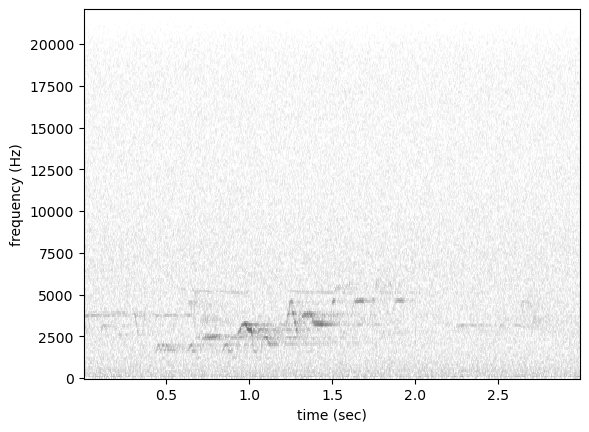

In [40]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292071.mp3 52.5 55.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.7327694296836853 
Actual = 1.0
Check below


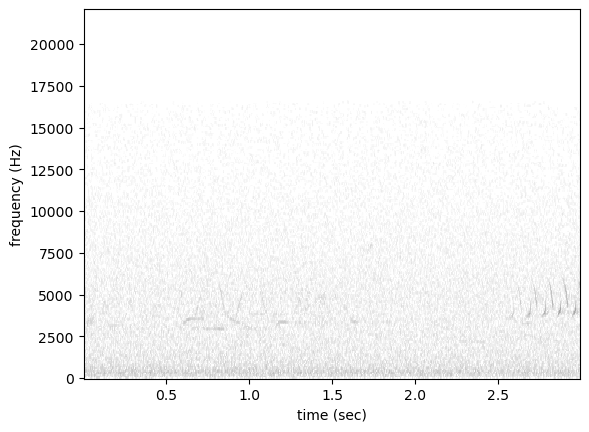

In [15]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-541632.flac 10.5 13.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9998189806938171 
Actual = 1.0
Check below


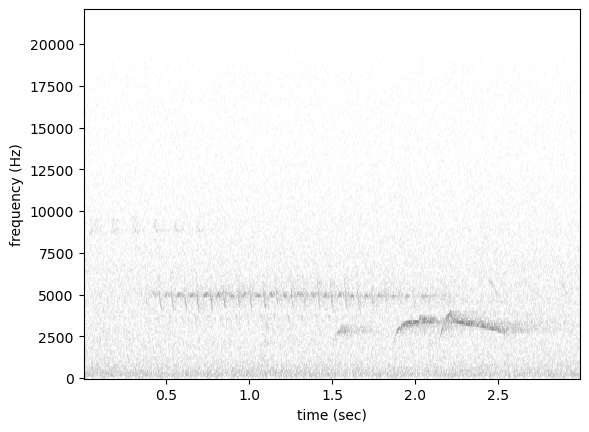

In [16]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-556748.flac 42.0 45.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9986166954040527 
Actual = 1.0
Check below


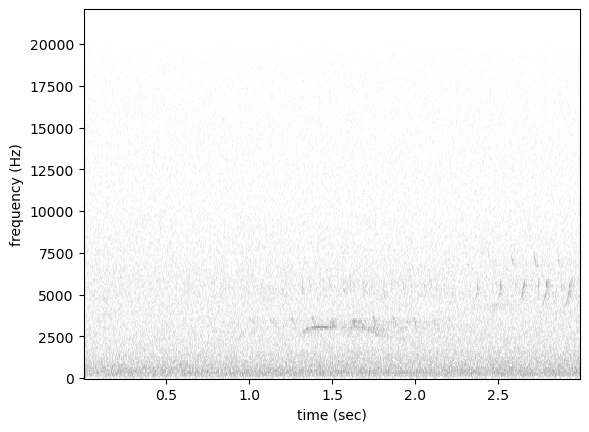

In [17]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-813319.flac 0.0 3.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.04093102365732193 
Actual = 1.0
Check below


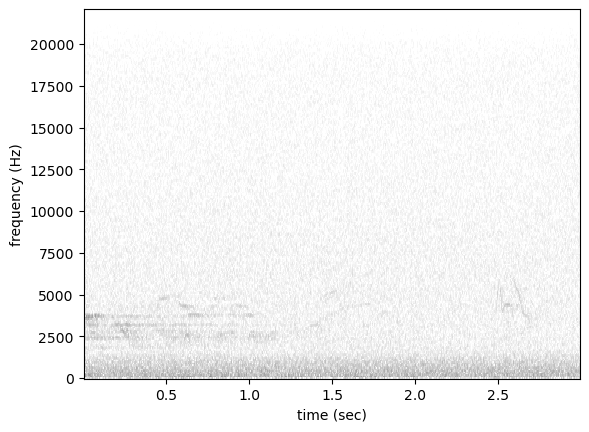

In [18]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292507.mp3 19.5 22.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9905440807342529 
Actual = 1.0
Check below


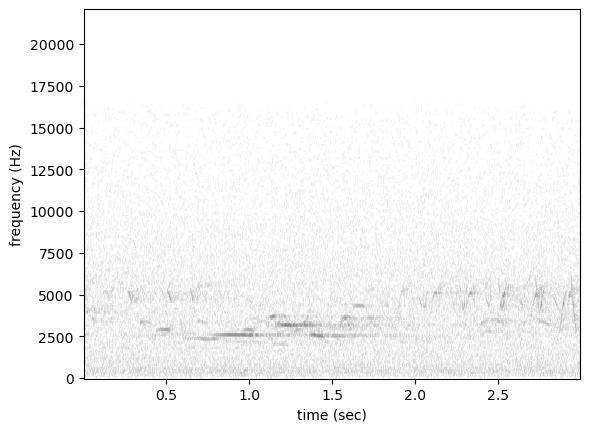

In [19]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554028.flac 24.0 27.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9852681159973145 
Actual = 1.0
Check below


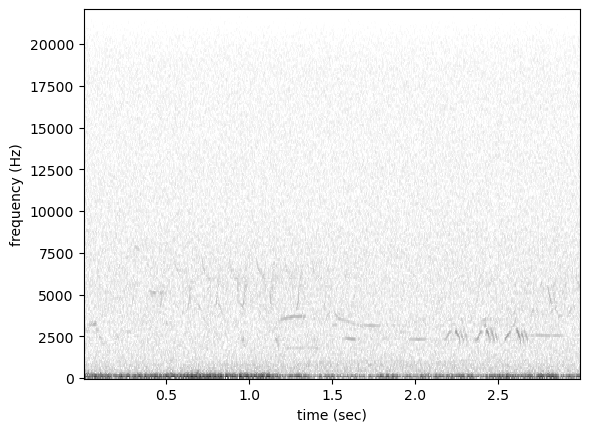

In [20]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-815818.flac 43.5 46.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9849918484687805 
Actual = 1.0
Check below


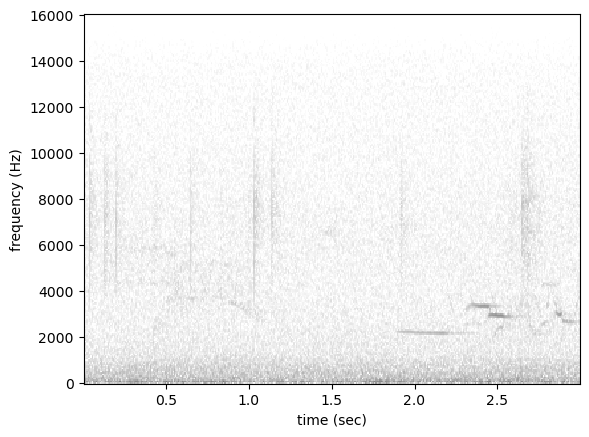

In [21]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-556675.flac 4.5 7.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9987418055534363 
Actual = 1.0
Check below


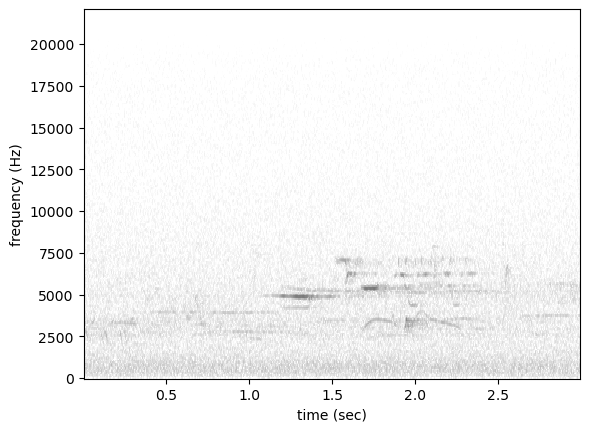

In [22]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-296785.mp3 34.5 37.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9996104836463928 
Actual = 1.0
Check below


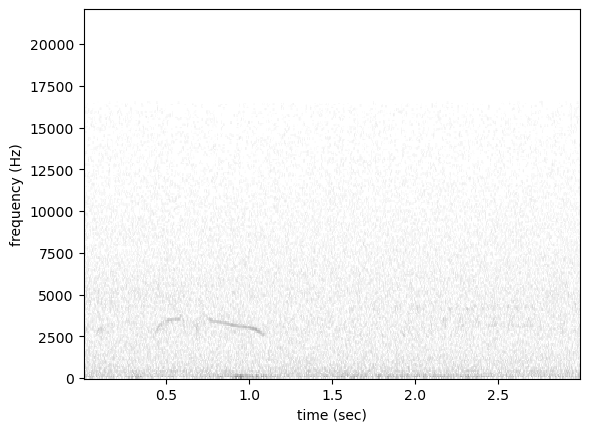

In [23]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-169644.flac 22.5 25.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.15298740565776825 
Actual = 0.0
Check below


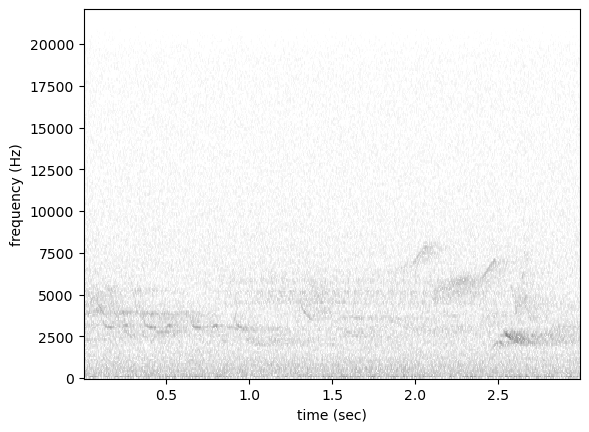

In [24]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554028.flac 0.0 3.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.08342184871435165 
Actual = 0.0
Check below


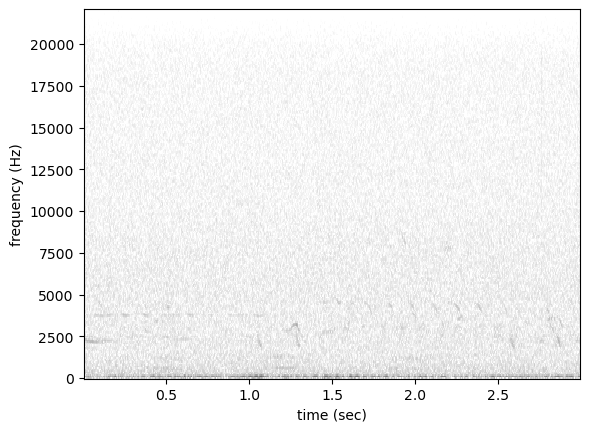

In [25]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292507.mp3 18.0 21.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.530658483505249 
Actual = 0.0
Check below


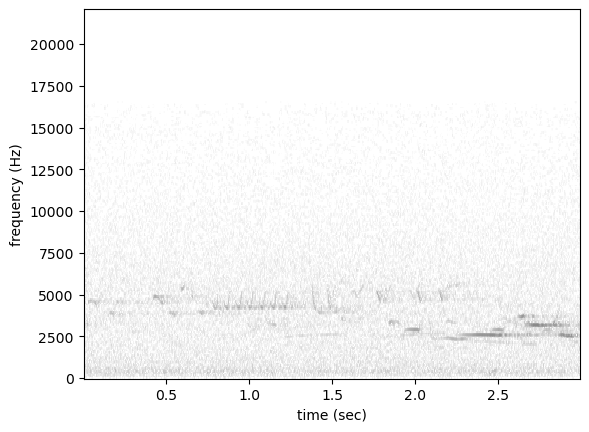

In [26]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-481585.flac 48.0 51.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.6422770023345947 
Actual = 0.0
Check below


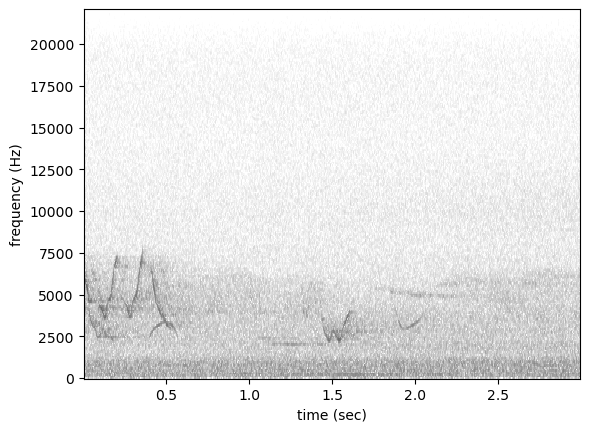

In [27]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-816783.flac 7.5 10.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.05180290341377258 
Actual = 0.0
Check below


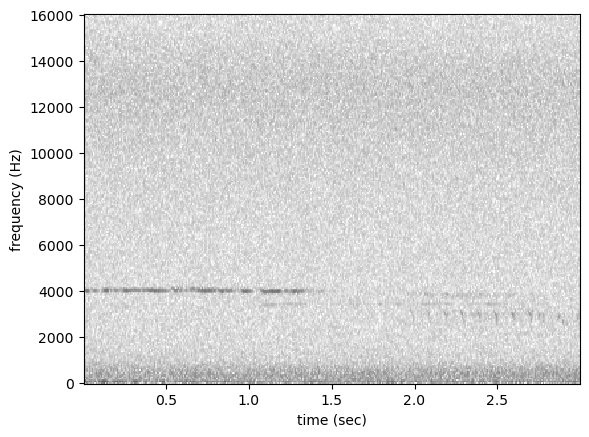

In [28]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553491.flac 88.5 91.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.09731803089380264 
Actual = 0.0
Check below


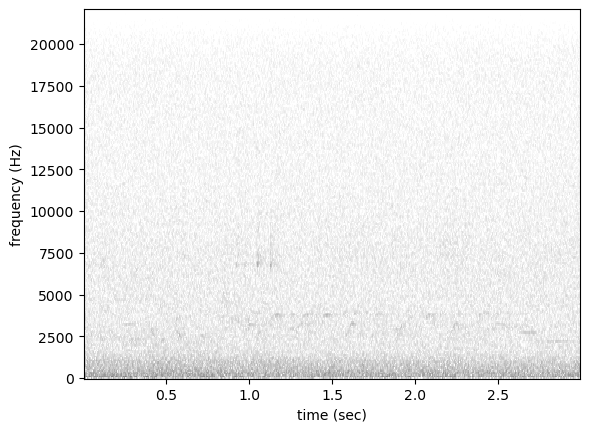

In [29]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-816783.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.09793322533369064 
Actual = 0.0
Check below


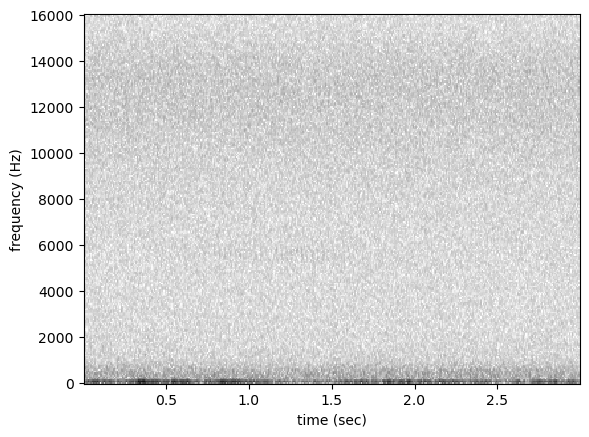

In [30]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292071.mp3 24.0 27.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.03146519884467125 
Actual = 0.0
Check below


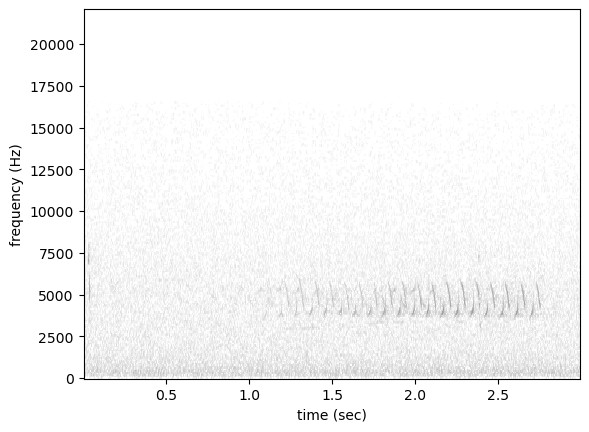

In [31]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-291730.mp3 172.5 175.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.030990691855549812 
Actual = 0.0
Check below


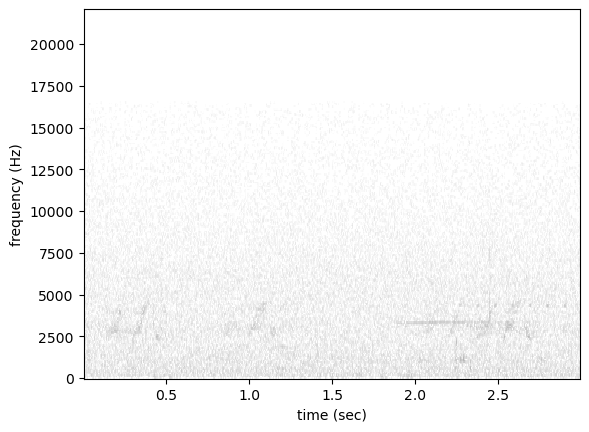

In [32]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-481585.flac 79.5 82.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.18968932330608368 
Actual = 0.0
Check below


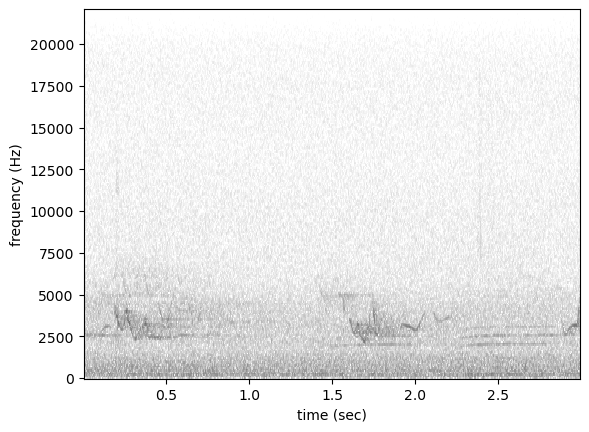

In [33]:
next_example_idx = show_example(next_example_idx)

Further work for this notebook:

1. show confusion matrix
2. plot the examples with the highest losses. 